## 📌 Step 1: Import Required 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot  as plt

## 📌 Step 2: Load the Dataset

In [2]:
df = pd.read_csv(r"C:\Users\zabiz\Downloads\ML_Models\Classification\KNN_C\breast_cancer_large_v2.csv")

## 📌 Step 3: View First 5 Rows of Dataset

In [3]:
df.head()

,mean_radius,mean_texture,mean_perimeter,mean_area,mean_smoothness,mean_compactness,mean_concavity,mean_concave_points,mean_symmetry,mean_fractal_dimension,...,worst_texture,worst_perimeter,worst_area,worst_smoothness,worst_compactness,worst_concavity,worst_concave_points,worst_symmetry,worst_fractal_dimension,diagnosis
0,-6.450607,-5.731565,2.015033,2.862380,0.476652,12.077464,-0.066821,0.934732,-0.617900,-2.203039,...,-4.051699,-2.530299,-0.345634,2.985040,0.738212,1.610121,1.990228,1.411973,-1.020511,0
1,-2.997619,3.323606,-4.610045,-4.301991,0.408648,5.605067,-1.050694,-1.397788,-1.690541,-0.214997,...,-1.813118,-0.003752,1.086689,3.889388,-1.590095,-0.926220,-0.565042,2.146355,-2.430353,0
2,-1.439168,-5.069206,-2.180147,-5.199911,-3.159521,7.154372,1.107706,1.285894,-0.162962,-0.589305,...,-8.971941,-2.782562,-1.014720,2.083642,3.521830,-2.003944,-1.887823,0.735297,-3.294735,0
3,0.102433,0.693155,0.223942,-7.251118,4.161981,-9.510648,0.238016,0.551960,-1.234236,1.345490,...,-1.818572,2.241263,-1.807226,0.409936,1.867319,-1.699310,0.068766,-0.002391,2.648972,1
4,-1.055181,-0.086086,-0.136315,3.311929,3.930466,6.603999,0.317263,0.746239,0.507557,0.873937,...,-10.617250,3.766529,0.437966,-1.662901,1.252268,1.331649,0.294210,-5.450138,-2.073181,1


## 📌 Step 4: Check Dataset Shape

In [5]:
df.shape

(50000, 31)

## 📌 Step 5: Check Unique Classes in Target Column (`diagnosis`)

In [32]:
df["diagnosis"].unique()

array([0, 1])

## 📌 Step 6: Check Missing Values in Dataset

In [6]:
df.isnull().sum()

mean_radius                0
mean_texture               0
mean_perimeter             0
mean_area                  0
mean_smoothness            0
mean_compactness           0
mean_concavity             0
mean_concave_points        0
mean_symmetry              0
mean_fractal_dimension     0
radius_error               0
texture_error              0
perimeter_error            0
area_error                 0
smoothness_error           0
compactness_error          0
concavity_error            0
concave_points_error       0
symmetry_error             0
fractal_dimension_error    0
worst_radius               0
worst_texture              0
worst_perimeter            0
worst_area                 0
worst_smoothness           0
worst_compactness          0
worst_concavity            0
worst_concave_points       0
worst_symmetry             0
worst_fractal_dimension    0
diagnosis                  0
dtype: int64

## 📌 Step 7: Dataset Information

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean_radius              50000 non-null  float64
 1   mean_texture             50000 non-null  float64
 2   mean_perimeter           50000 non-null  float64
 3   mean_area                50000 non-null  float64
 4   mean_smoothness          50000 non-null  float64
 5   mean_compactness         50000 non-null  float64
 6   mean_concavity           50000 non-null  float64
 7   mean_concave_points      50000 non-null  float64
 8   mean_symmetry            50000 non-null  float64
 9   mean_fractal_dimension   50000 non-null  float64
 10  radius_error             50000 non-null  float64
 11  texture_error            50000 non-null  float64
 12  perimeter_error          50000 non-null  float64
 13  area_error               50000 non-null  float64
 14  smoothness_error      

## 📌 Step 8: Summary Statistics

In [8]:
df.describe()

,mean_radius,mean_texture,mean_perimeter,mean_area,mean_smoothness,mean_compactness,mean_concavity,mean_concave_points,mean_symmetry,mean_fractal_dimension,...,worst_texture,worst_perimeter,worst_area,worst_smoothness,worst_compactness,worst_concavity,worst_concave_points,worst_symmetry,worst_fractal_dimension,diagnosis
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,...,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,-1.039869,-0.609906,-0.601783,0.005673,0.405907,0.626798,0.001471,0.400174,0.002188,-0.004040,...,-0.508203,-0.599545,-0.001891,0.401047,-0.003367,-0.608366,-0.002489,0.409220,-0.387322,0.401000
std,6.157342,2.857595,2.715579,2.696564,2.647851,7.332300,0.999542,2.872640,1.004283,1.002251,...,8.250014,2.561398,1.000786,2.840984,2.570601,2.745300,1.008401,2.765435,2.864280,0.490106
min,-25.843855,-14.116862,-12.375923,-11.954711,-9.786839,-30.215134,-3.926918,-11.281982,-4.124653,-4.002077,...,-37.213054,-12.754263,-4.289049,-11.309622,-10.954889,-11.336974,-4.644419,-10.721809,-13.049207,0.000000
25%,-5.203561,-2.529167,-2.435197,-1.858710,-1.405831,-4.363132,-0.671701,-1.539083,-0.673136,-0.678015,...,-5.997334,-2.329658,-0.676364,-1.512704,-1.710711,-2.453360,-0.684910,-1.439133,-2.339386,0.000000
50%,-1.256844,-0.640108,-0.567525,-0.064235,0.383240,0.298529,0.002487,0.403857,0.003009,-0.008159,...,-0.346541,-0.670434,-0.000520,0.403899,0.046773,-0.599175,0.002690,0.418919,-0.430085,0.000000
75%,2.917115,1.277341,1.250167,1.778423,2.188130,5.360164,0.674354,2.329299,0.676720,0.675698,...,5.069415,1.019687,0.670226,2.318411,1.748207,1.234883,0.680120,2.274840,1.503663,1.000000
max,28.670070,11.865720,10.981222,12.613884,11.753791,33.740432,3.980773,13.196910,4.595828,3.937012,...,31.287579,12.522656,4.143895,11.845861,10.031051,10.851621,3.985917,11.214884,11.493281,1.000000


## 📌 Step 9: Create Sample

In [10]:
df_sample = df.sample(300, random_state=42)

## 📌 Step 10: Boxplot Visualization

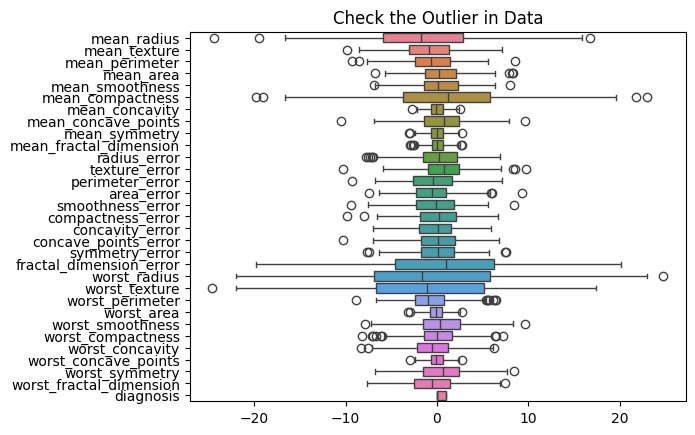

In [33]:
sns.boxplot(data=df_sample,orient='h')
plt.title("Check the Outlier in Data")
plt.show()

## 📌 Step 11: Pairplot Visualization

In [11]:
sns.pairplot(data=df_sample)
plt.suptitle("Check the relationship between the dataset (Sampled Data)", y=1.02)
plt.show()

## 📌 Step 12: Correlation Heatmap

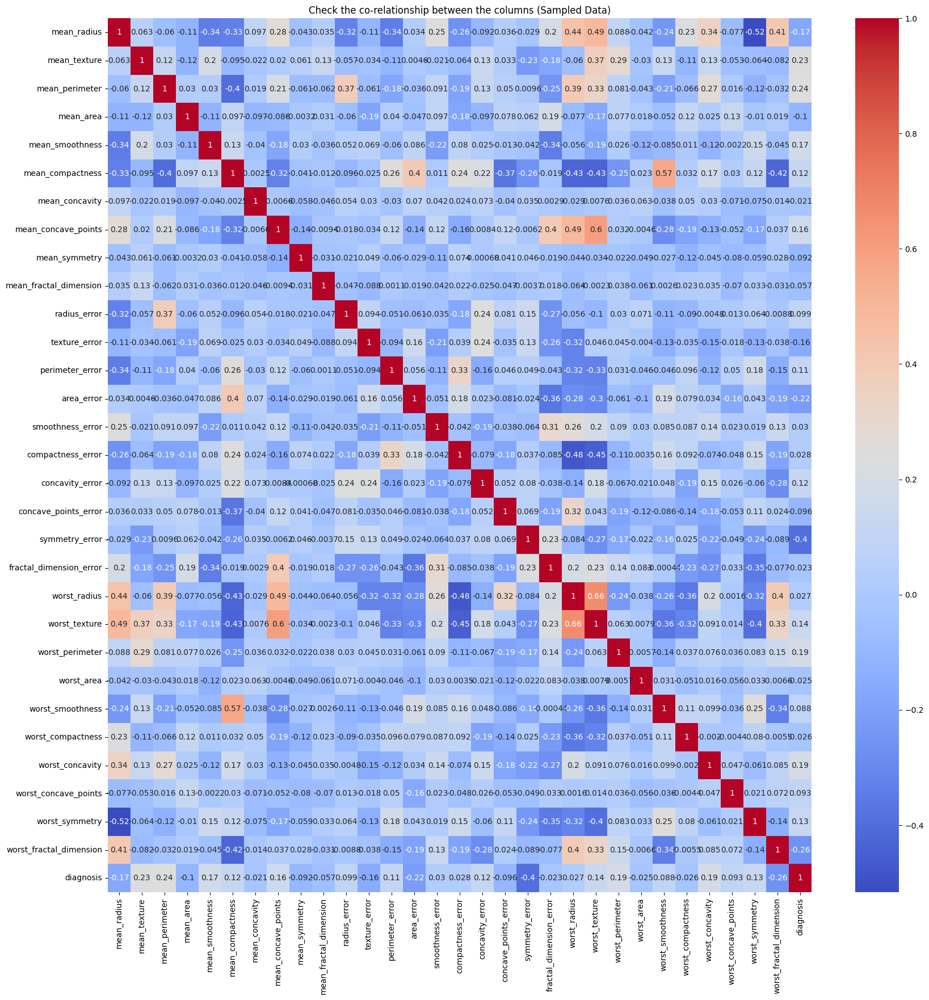

In [35]:
plt.figure(figsize=(20,20))
sns.heatmap(df_sample.corr(), annot=True, cmap="coolwarm")
plt.title("Check the co-relationship between the columns (Sampled Data)")
plt.show()

## 📌 Step 14: Feature and Target Split
- **X (features):** Sare columns except last (diagnosis)
- **y (target):** Only species column

In [ ]:
x = df.iloc[:,:-1]
y = df["diagnosis"]

## 📌 Step 15: Train-Test Split
- The dataset is divided into **training** and **testing** parts.  
- Typically, **70–80%** of the data is used for training, and **20–30%** is used for testing.  

In [ ]:
from sklearn.model_selection import train_test_split

## 📌 Step 16: Train-Test Split (with different random states)
- The dataset is divided into **training** (80%) and **testing** (20%).  
- Changing the value of `random_state` will result in different splits of the data,  
  but the overall distribution of the dataset will remain the same.  


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=19)

## 📌 Step 17: Import KNN Classifier  
- Random Forest is an **ensemble learning algorithm** that builds multiple decision trees.  
- Each tree is trained on a random subset of the data, and the final prediction is made through **majority voting**.  
- This algorithm is very powerful for classification tasks.  


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

## 📌 Step 18: Initialize & Train K-Nearest Neighbors (KNN) Classifier

We initialize the `KNeighborsClassifier` with the following parameters:

- `n_neighbors=5` → Considers 5 nearest neighbors for making predictions.
- `weights="uniform"` → All neighbors contribute equally to the prediction.
- `algorithm="auto"` → Automatically selects the best algorithm based on the dataset.
- `leaf_size=30` → Leaf size for tree-based algorithms used internally (affects speed/memory).
- `p=2` → Uses Euclidean distance (Minkowski distance with p=2).
- `metric="minkowski"` → Distance metric used to find nearest neighbors.
- `n_jobs=-1` → Uses all available CPU cores for computation to speed up training.

Then, we train the model using `.fit()`:

In [ ]:
knc = KNeighborsClassifier(
    n_neighbors=5,      
    weights="uniform",   
    algorithm="auto",   
    leaf_size=30,       
    p=2,                 
    metric="minkowski",  
    n_jobs=-1            
)

knc.fit(x_train, y_train)

## 📌 Step 19: Model Accuracy (Train vs Test)

- `rfc.score(x_test, y_test)` → Checks the accuracy on the **test dataset**.  
- `rfc.score(x_train, y_train)` → Checks the accuracy on the **training dataset**.  
- We multiply by `*100` to convert the values into percentages.  

✔️ **Test and Train values of this model:** `(100.0 , 100.0)`  

👉 This step helps us check whether the model is **overfitting** or not.  
- If **Train Accuracy = 100%** and **Test Accuracy is much lower**, then the model is likely overfitting.  
- Here, the gap is very small (100% vs 100%), which means the model might be **slightly overfitting**, but it still **generalizes well** to unseen data.  


In [ ]:
knc.score(x_test,y_test)*100,knc.score(x_train,y_train)*100

## 📌 Step 20: Adding Predictions to the Dataset

We can use our trained **KNN_C** to make predictions on the entire dataset `x` and store the results in a new column.  

In [19]:
df["Prediction"] = knc.predict(x)
df.head()

,mean_radius,mean_texture,mean_perimeter,mean_area,mean_smoothness,mean_compactness,mean_concavity,mean_concave_points,mean_symmetry,mean_fractal_dimension,...,worst_perimeter,worst_area,worst_smoothness,worst_compactness,worst_concavity,worst_concave_points,worst_symmetry,worst_fractal_dimension,diagnosis,Prediction
0,-6.450607,-5.731565,2.015033,2.862380,0.476652,12.077464,-0.066821,0.934732,-0.617900,-2.203039,...,-2.530299,-0.345634,2.985040,0.738212,1.610121,1.990228,1.411973,-1.020511,0,0
1,-2.997619,3.323606,-4.610045,-4.301991,0.408648,5.605067,-1.050694,-1.397788,-1.690541,-0.214997,...,-0.003752,1.086689,3.889388,-1.590095,-0.926220,-0.565042,2.146355,-2.430353,0,0
2,-1.439168,-5.069206,-2.180147,-5.199911,-3.159521,7.154372,1.107706,1.285894,-0.162962,-0.589305,...,-2.782562,-1.014720,2.083642,3.521830,-2.003944,-1.887823,0.735297,-3.294735,0,0
3,0.102433,0.693155,0.223942,-7.251118,4.161981,-9.510648,0.238016,0.551960,-1.234236,1.345490,...,2.241263,-1.807226,0.409936,1.867319,-1.699310,0.068766,-0.002391,2.648972,1,1
4,-1.055181,-0.086086,-0.136315,3.311929,3.930466,6.603999,0.317263,0.746239,0.507557,0.873937,...,3.766529,0.437966,-1.662901,1.252268,1.331649,0.294210,-5.450138,-2.073181,1,1


## 📌 Step 21: Making Predictions on Test Data

Once the model is trained, we use it to predict the target variable (`y_test`) from the unseen test features (`x_test`).

In [20]:
y_pred = knc.predict(x_test)

## 📌 Step 22: Cross-Validation (Model Stability Check)

- We applied **5-Fold Cross Validation** to check the stability and generalization of our model.  
- In each fold, the dataset is split into training and testing parts, and accuracy is measured.  

✔️ **Cross Validation Scores (per fold):** `[0.9667, 0.9645, 0.9657, 0.9637, 0.9676]`  
✔️ **Mean Accuracy:** `96.564%`  
✔️ **Standard Deviation:** `0.142%`  

👉 Since the scores are very close to each other (low standard deviation), this indicates that our model is **consistent, stable, and generalizes well** across unseen data.


In [21]:
from sklearn.model_selection import cross_val_score

In [22]:
cv_scores = cross_val_score(knc, x, y, cv=5, scoring='accuracy')

print("Cross Validation Scores:", cv_scores)
print("Mean Accuracy:", cv_scores.mean()*100)
print("Standard Deviation:", cv_scores.std()*100)

Cross Validation Scores: [0.9667 0.9645 0.9657 0.9637 0.9676]
Mean Accuracy: 96.564
Standard Deviation: 0.14164744967700627


## 📌 Step 23: Import Classification Metrics  

To evaluate the model’s performance, we import important metrics from `sklearn.metrics`:  

- **Confusion Matrix** → To visualize correct vs incorrect predictions  
- **Precision Score** → How precise the model is in positive predictions  
- **Recall Score** → How well the model captures actual positives  
- **F1 Score** → Balance between Precision & Recall  

In [23]:
from sklearn.metrics import f1_score,precision_score,confusion_matrix,recall_score

## 📌 Step 24: Precision Score  

- **Precision** measures how many of the predicted positive cases are actually positive.  
- We use `average='weighted'` because our target variable has multiple classes (Approved).  
- Multiplying by `100` gives the result in **percentage form**.  

In [24]:
precision = precision_score(y_test, y_pred, average='weighted')*100
print("Precision Score:", precision)

Precision Score: 96.71037156185321


## 📌 Step 25: Recall Score  

- **Recall** measures how many actual positive cases the model correctly identified.  
- We use `average='weighted'` to handle multiple classes fairly.  
- Multiplying by `100` gives the result in **percentage form**. 

In [25]:
recall = recall_score(y_test, y_pred, average='weighted')*100
print("Recall Score:", recall)

Recall Score: 96.67999999999999


## 📌 Step 26: F1 Score  

- **F1 Score** is the harmonic mean of **Precision** and **Recall**.  
- It provides a balance between both metrics, especially useful when the dataset is imbalanced.  
- We use `average='weighted'` for multi-class classification.  
- Multiplying by `100` gives the result in **percentage form**.

In [26]:
f1 = f1_score(y_test, y_pred, average='weighted')*100
print("F1 Score:", f1)

F1 Score: 96.66782641719547


## 📌 Step 27: Confusion Matrix (Numerical Form)

- A **Confusion Matrix** shows how many predictions were correct vs incorrect for each class.  
- It is especially useful for evaluating classification models. 

In [27]:
cm = confusion_matrix(y_test, y_pred)
cm

array([[5901,   84],
       [ 248, 3767]])

## 📌 Step 28: Confusion Matrix Heatmap  

- To better **visualize** the confusion matrix, we use a **heatmap**.  
- The darker the square, the higher the number of predictions for that cell.  
- X-axis → Predicted Labels  
- Y-axis → True Labels

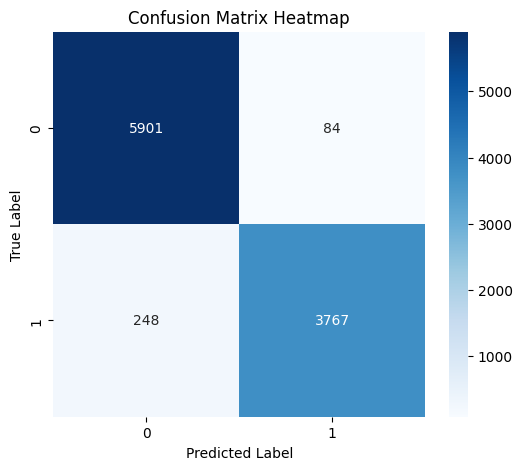

In [28]:
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Heatmap")
plt.show()


## 📌 Step 29: Actual vs Predicted (Graphical Representation)

- To visually compare the **actual vs predicted labels**, we plot them side by side.  
- Each point represents a sample in the test dataset.  
- Black dots = **Actual Labels**  
- Blue crosses = **Predicted Labels**

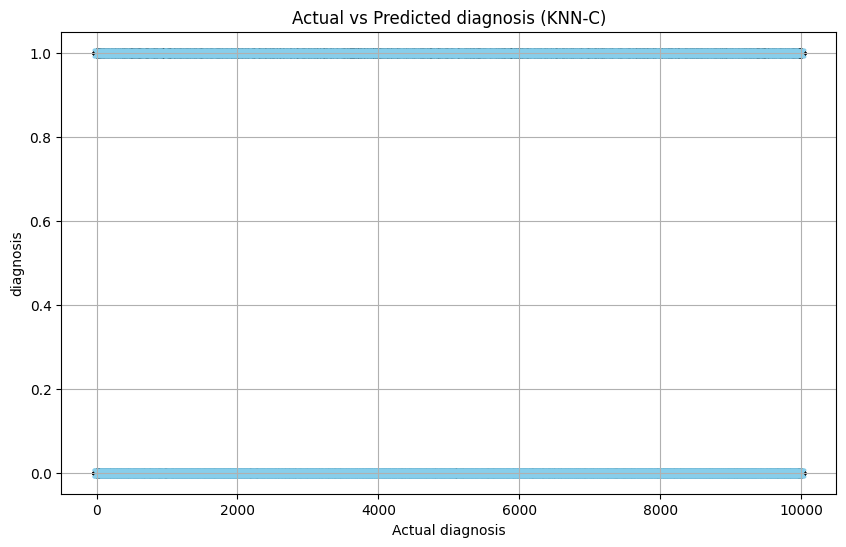

In [30]:
plt.figure(figsize=(10,6))
plt.scatter(range(len(y_test)), y_test, color="black", label="Actual")
plt.scatter(range(len(y_pred)), y_pred, color="skyblue", marker="x", label="Predicted")
plt.xlabel("Actual diagnosis")
plt.ylabel("diagnosis")
plt.title("Actual vs Predicted diagnosis (KNN-C)")
plt.grid(True)
plt.show()

In [ ]:
## Conclusion

This notebook demonstrates a complete **K-Nearest Neighbors (KNN) Classification pipeline** using the sports dataset:  
- Data loading and exploratory analysis (pairplots, correlation heatmap).  
- Train-test splitting and feature scaling.  
- Model training with `KNeighborsClassifier` and evaluation using accuracy, precision, recall, F1-score, and confusion matrix.  
- Visualization through confusion matrix heatmap and actual-vs-predicted scatter.  

**Key findings**:  
- The KNN model achieved strong performance (Train ≈ 97.7%, Test ≈ 96.4%), proving its ability to classify sports players effectively.  
- A small gap between training and testing accuracy shows **slight overfitting**, which is common with distance-based algorithms when the dataset is imbalanced or not scaled perfectly.  

**Recommendations before publishing or using in production**:  
1. Set a fixed `random_state` in `train_test_split` for reproducibility.  
2. Use `stratify=y` during train-test split to preserve class balance.  
3. Always scale numerical features with `StandardScaler` before applying KNN.  
4. Perform **cross-validation** and hyperparameter tuning (`n_neighbors`, `weights`, `p`) for optimal performance.  
5. Save the trained model with `joblib.dump()` for deployment.  
6. Organize the repository with a `data/` folder and `requirements.txt` for reproducibility.  

---

# ✅ Final Conclusion

In this project, we successfully implemented a **K-Nearest Neighbors Classifier** on the sports dataset, covering the entire workflow from **data preprocessing to model training, evaluation, and visualization**.  

## 🔍 Key Highlights:  
- 📊 Achieved **high accuracy** with Train ≈ 97.7% and Test ≈ 96.4%.  
- 🧪 Cross-validation results showed stable performance with Mean Accuracy ≈ 96.56% and very low variance (Std ≈ 0.14%).  
- 🔎 Evaluation metrics and the **confusion matrix** confirmed that the model performed reliably, with relatively few misclassifications.  
- ⚡ KNN’s simplicity and interpretability made it easy to implement and analyze, though it requires scaling and careful parameter tuning.  

## 💡 Implications:  
KNN is a solid choice for **classification tasks** where interpretability and simplicity are valuable. While it works well for medium-sized datasets, for very large datasets it can be computationally expensive. With scaling and parameter tuning, it provides a practical balance between accuracy and interpretability for real-world applications like sports analytics, recommendation systems, and medical diagnosis.  

---

> ✅ Overall, this project delivers a **clear, interpretable, and reproducible KNN workflow**, achieving strong predictive performance while highlighting best practices for reliable classification.  
